In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 20.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found exi

In [2]:
import numpy as np
import cv2
import os
import torch
import yaml
from ultralytics import YOLO
import yaml

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
data_path='/kaggle/input/new-data-1/New Data'

In [4]:
train=os.path.join(data_path, 'train')

In [5]:
test=os.path.join(data_path,'test')

In [6]:
valid=os.path.join(data_path,'valid')

In [7]:
out_path=os.path.join(data_path,'output')

In [8]:
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train, valid, test, out_path))

Data Path: /kaggle/input/new-data-1/New Data
Train Path: /kaggle/input/new-data-1/New Data/train
Valid Path: /kaggle/input/new-data-1/New Data/valid
Test Path: /kaggle/input/new-data-1/New Data/test
Output Path: /kaggle/input/new-data-1/New Data/output


In [9]:
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train, valid, test]
class_names = ['Dog', 'Eiffel tower', 'Mountain', 'Train', 'Tree']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Dog', 1: 'Eiffel tower', 2: 'Mountain', 3: 'Train', 4: 'Tree'}


In [10]:
ppe_data = dict(train = train,
                    val = valid,
                    test = test,
                   nc = len(class_names),
                   names = class_names)
with open('ppe_data.yaml', 'w') as output:
    yaml.dump(ppe_data, output, default_flow_style = True)

In [11]:
ppe_data

{'train': '/kaggle/input/new-data-1/New Data/train',
 'val': '/kaggle/input/new-data-1/New Data/valid',
 'test': '/kaggle/input/new-data-1/New Data/test',
 'nc': 5,
 'names': ['Dog', 'Eiffel tower', 'Mountain', 'Train', 'Tree']}

In [12]:
model = YOLO("/kaggle/input/new-data-1/New Data/yolov8n.yaml")

In [13]:
model = YOLO("/kaggle/input/new-data-1/New Data/yolov8n.pt")

In [14]:
model = YOLO("/kaggle/input/new-data-1/New Data/yolov8n.yaml").load("/kaggle/input/new-data-1/New Data/yolov8n.pt")

Transferred 355/355 items from pretrained weights


In [15]:
torch.cuda.empty_cache()

In [16]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [17]:
os.environ["WANDB_MODE"] = "disabled"

In [18]:
results = model.train(
    data="ppe_data.yaml",
    epochs=75,
    imgsz=640,
    multi_scale=True,
    device=[0,1],
    mask_ratio=4,
    batch=16,
    nbs=64,
    workers=8,
    seed=0,
    box=7.5,
    flipud=0.5,  # Horizontal flip
    fliplr=0.5,  # Vertical flip
    degrees=10.0,  # Rotation
    shear=10.0,  # Shear
    scale=0.1,  # Apply slight zoom (closer to original size)
    fraction=1.0,
    pose=12.0  # This is the corrected pose parameter
)

Ultralytics 8.3.160 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=ppe_data.yaml, degrees=10.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=75, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/input/new-data-1/New Data/yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=True, name=train, nbs=64, nms=False, opset=None, optimize=Fa

100%|██████████| 755k/755k [00:00<00:00, 17.0MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.8MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 17.6±7.6 MB/s, size: 59.3 KB)


train: Scanning /kaggle/input/new-data-1/New Data/train/labels... 1574 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1574/1574 [00:03<00:00, 393.86it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/new-data-1/New Data/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 67, len(boxes) = 2061. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 15.3±7.4 MB/s, size: 59.0 KB)


val: Scanning /kaggle/input/new-data-1/New Data/valid/labels... 280 images, 0 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<00:00, 378.05it/s]/s] 
train: Scanning /kaggle/input/new-data-1/New Data/train/labels... 724 images, 0 backgrounds, 0 corrupt:  46%|████▌     | 724/1574 [00:00<00:00, 995.47it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/new-data-1/New Data/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 10, len(boxes) = 356. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


train: Scanning /kaggle/input/new-data-1/New Data/train/labels... 1346 images, 0 backgrounds, 0 corrupt:  86%|████████▌ | 1346/1574 [00:01<00:00, 1016.45it/s]

Plotting labels to runs/detect/train/labels.jpg... 


train: Scanning /kaggle/input/new-data-1/New Data/train/labels... 1574 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1574/1574 [00:01<00:00, 1008.73it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 75 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/75      2.94G      1.584      2.999      2.061          8        928: 100%|██████████| 99/99 [00:30<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  4.51it/s]


                   all        280        356      0.463      0.552      0.504      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/75      2.96G       1.52      2.365      1.976          8        704: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.43it/s]


                   all        280        356      0.508      0.548      0.478      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/75      2.98G       1.54      2.161       1.96         12        448: 100%|██████████| 99/99 [00:23<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.53it/s]


                   all        280        356      0.396      0.456      0.375      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/75         3G      1.497      1.972      1.926          8        640: 100%|██████████| 99/99 [00:23<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.66it/s]


                   all        280        356      0.606       0.53      0.524      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/75      3.02G      1.493      1.917      1.913          8        480: 100%|██████████| 99/99 [00:23<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.29it/s]


                   all        280        356      0.655      0.535      0.582      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/75      3.03G      1.447      1.834      1.917          8        960: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.59it/s]


                   all        280        356      0.648      0.694      0.714       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/75      3.05G      1.406       1.72      1.904          8        960: 100%|██████████| 99/99 [00:24<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.63it/s]


                   all        280        356      0.702        0.6      0.691       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/75      3.07G       1.39      1.607      1.845          6        544: 100%|██████████| 99/99 [00:24<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.36it/s]


                   all        280        356      0.625       0.64        0.7      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/75      3.09G      1.367      1.584      1.796          7        960: 100%|██████████| 99/99 [00:24<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.57it/s]


                   all        280        356      0.704      0.523      0.559      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/75       3.1G      1.368       1.51      1.832         13        832: 100%|██████████| 99/99 [00:24<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.46it/s]


                   all        280        356      0.669      0.681      0.714       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/75      3.12G      1.338      1.461      1.808          7        768: 100%|██████████| 99/99 [00:25<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.56it/s]


                   all        280        356      0.777      0.665      0.744      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/75      3.14G      1.331      1.482      1.814         10        576: 100%|██████████| 99/99 [00:25<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.37it/s]


                   all        280        356      0.727      0.714      0.723      0.362


  0%|          | 0/99 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/75      3.15G      1.307      1.424      1.781          9        352: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.69it/s]


                   all        280        356      0.783      0.682      0.752      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/75      3.17G      1.314      1.397      1.771         12        544: 100%|██████████| 99/99 [00:23<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.53it/s]


                   all        280        356      0.822      0.738      0.791      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/75      3.19G      1.276      1.352      1.776         11        736: 100%|██████████| 99/99 [00:24<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.67it/s]


                   all        280        356      0.707       0.74      0.753      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/75      3.21G       1.31      1.401      1.791          6        480: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.69it/s]


                   all        280        356      0.811      0.752      0.814      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/75      3.22G      1.254      1.305      1.741          6        704: 100%|██████████| 99/99 [00:24<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.67it/s]


                   all        280        356      0.762      0.719      0.779      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/75      3.24G      1.261      1.317      1.728         10        864: 100%|██████████| 99/99 [00:23<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.21it/s]


                   all        280        356      0.775      0.688      0.778      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/75      3.26G      1.213      1.261      1.711          9        320: 100%|██████████| 99/99 [00:24<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.65it/s]


                   all        280        356      0.815      0.792      0.837      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/75      3.27G      1.275      1.283      1.726          6        576: 100%|██████████| 99/99 [00:24<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]


                   all        280        356      0.871      0.783      0.847       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/75      3.29G      1.251      1.287      1.756          9        960: 100%|██████████| 99/99 [00:24<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.55it/s]


                   all        280        356      0.848      0.738      0.836      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/75      3.31G      1.228      1.267      1.702         10        352: 100%|██████████| 99/99 [00:24<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]


                   all        280        356      0.837      0.823      0.854      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/75      3.33G      1.206        1.2      1.629          8        704: 100%|██████████| 99/99 [00:23<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.42it/s]


                   all        280        356      0.848       0.79      0.851      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/75      3.34G      1.204      1.211      1.689         10        320: 100%|██████████| 99/99 [00:23<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.55it/s]


                   all        280        356      0.795      0.786      0.828      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/75      3.36G      1.225      1.228      1.703          7        960: 100%|██████████| 99/99 [00:23<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.30it/s]


                   all        280        356      0.793      0.839      0.865      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/75      3.38G      1.194      1.198      1.709          9        448: 100%|██████████| 99/99 [00:23<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]


                   all        280        356      0.825      0.759       0.84      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/75      3.39G      1.184      1.158      1.689          6        512: 100%|██████████| 99/99 [00:24<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.73it/s]


                   all        280        356       0.85      0.834      0.874      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/75      3.41G      1.156      1.116      1.667          7        448: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]


                   all        280        356      0.858      0.821      0.867      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/75      3.42G      1.158      1.096      1.645          7        768: 100%|██████████| 99/99 [00:23<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.76it/s]


                   all        280        356      0.826       0.86      0.865      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/75      3.44G      1.186      1.137      1.694          9        320: 100%|██████████| 99/99 [00:24<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]


                   all        280        356       0.83       0.85      0.881      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/75      3.46G      1.136       1.11      1.666         10        544: 100%|██████████| 99/99 [00:24<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.72it/s]


                   all        280        356      0.868      0.805      0.865      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/75      3.48G      1.155      1.071      1.652          5        448: 100%|██████████| 99/99 [00:24<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.42it/s]


                   all        280        356      0.847      0.877      0.883      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/75       3.5G      1.153       1.09      1.633          9        448: 100%|██████████| 99/99 [00:24<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.61it/s]


                   all        280        356      0.866      0.855      0.878      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/75      3.51G      1.131      1.057        1.6          9        864: 100%|██████████| 99/99 [00:23<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.74it/s]


                   all        280        356      0.899      0.835      0.887      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/75      3.53G      1.099      1.017      1.616          8        928: 100%|██████████| 99/99 [00:24<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.61it/s]


                   all        280        356      0.888      0.864      0.887      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/75      3.55G      1.122      1.021      1.621         13        480: 100%|██████████| 99/99 [00:24<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.82it/s]


                   all        280        356      0.908      0.825      0.891      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/75      3.56G      1.143      1.062      1.646          9        736: 100%|██████████| 99/99 [00:24<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]


                   all        280        356      0.887      0.848      0.885      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/75      3.58G      1.113      1.017      1.631         11        640: 100%|██████████| 99/99 [00:23<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.58it/s]


                   all        280        356      0.889       0.86      0.889      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/75       3.6G      1.108      1.016      1.631          8        928: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.61it/s]


                   all        280        356      0.909      0.864      0.893      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/75      3.62G      1.127      1.036      1.622          8        640: 100%|██████████| 99/99 [00:23<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.74it/s]


                   all        280        356      0.875      0.834      0.872      0.567


  0%|          | 0/99 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/75      3.63G       1.11     0.9942      1.622          8        800: 100%|██████████| 99/99 [00:24<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.69it/s]


                   all        280        356      0.907      0.833      0.889      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/75      3.65G      1.077     0.9618      1.581         10        416: 100%|██████████| 99/99 [00:24<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.51it/s]


                   all        280        356      0.893      0.837      0.891       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/75      3.67G      1.069     0.9656      1.566         10        608: 100%|██████████| 99/99 [00:24<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.91it/s]


                   all        280        356      0.895      0.846      0.881      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/75      3.68G      1.071     0.9588      1.569          8        928: 100%|██████████| 99/99 [00:23<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.45it/s]


                   all        280        356        0.9       0.84      0.882      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/75       3.7G      1.072     0.9439       1.59          9        480: 100%|██████████| 99/99 [00:23<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.58it/s]


                   all        280        356      0.849      0.872      0.894      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/75      3.72G      1.085     0.9775       1.59          6        320: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.74it/s]


                   all        280        356      0.849      0.861      0.873      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/75      3.73G      1.032     0.9367      1.535         11        384: 100%|██████████| 99/99 [00:24<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.78it/s]


                   all        280        356      0.894      0.858      0.884      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/75      3.75G      1.043     0.9234      1.565          8        672: 100%|██████████| 99/99 [00:24<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.72it/s]


                   all        280        356      0.883      0.853      0.875      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/75      3.77G      1.062     0.9406      1.575          8        608: 100%|██████████| 99/99 [00:24<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]


                   all        280        356      0.902      0.875      0.886      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/75      3.79G      1.064     0.9401      1.583         11        576: 100%|██████████| 99/99 [00:23<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.44it/s]


                   all        280        356       0.89      0.872      0.888      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/75       3.8G      1.017     0.9055      1.528         16        672: 100%|██████████| 99/99 [00:23<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.80it/s]


                   all        280        356      0.895      0.898        0.9      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/75      3.82G      1.032     0.8966      1.583         13        576: 100%|██████████| 99/99 [00:24<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.77it/s]


                   all        280        356      0.862      0.885      0.894      0.607

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/75      3.84G      1.059     0.9371      1.543          8        960: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.76it/s]


                   all        280        356      0.819      0.867      0.883      0.619

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/75      3.85G      1.051     0.9207       1.55          7        320: 100%|██████████| 99/99 [00:24<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.81it/s]


                   all        280        356      0.923      0.862        0.9      0.625

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/75      3.87G      1.045     0.9077      1.564         12        608: 100%|██████████| 99/99 [00:23<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.75it/s]


                   all        280        356      0.872      0.863      0.882      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/75      3.89G      1.008     0.8758      1.549          8        768: 100%|██████████| 99/99 [00:24<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.90it/s]


                   all        280        356      0.861      0.874      0.894      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/75       3.9G     0.9894      0.844      1.525          9        768: 100%|██████████| 99/99 [00:23<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.76it/s]


                   all        280        356      0.889      0.865      0.886      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/75      3.92G      1.013     0.8642      1.535          9        512: 100%|██████████| 99/99 [00:24<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.68it/s]


                   all        280        356      0.884      0.833      0.877       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/75      3.94G     0.9988     0.8602      1.529          8        864: 100%|██████████| 99/99 [00:23<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.54it/s]


                   all        280        356      0.931      0.861       0.91      0.631

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/75      3.96G     0.9984     0.8551      1.495         17        672: 100%|██████████| 99/99 [00:23<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.77it/s]


                   all        280        356      0.884       0.89      0.911      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/75      3.97G     0.9995     0.8586      1.514          9        704: 100%|██████████| 99/99 [00:24<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.77it/s]


                   all        280        356      0.886      0.893      0.911      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/75      3.99G     0.9794     0.8286      1.513         10        544: 100%|██████████| 99/99 [00:23<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.92it/s]


                   all        280        356      0.933       0.86      0.901      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/75      4.01G     0.9922      0.838      1.511          9        544: 100%|██████████| 99/99 [00:23<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.73it/s]


                   all        280        356      0.891      0.889      0.911      0.634

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/75      4.03G     0.9931     0.8538       1.53          7        352: 100%|██████████| 99/99 [00:24<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.79it/s]


                   all        280        356      0.854      0.881      0.887      0.632

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/75      4.04G     0.9953     0.8264        1.5          9        512: 100%|██████████| 99/99 [00:24<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.87it/s]


                   all        280        356      0.863      0.901        0.9      0.632
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/75      4.06G     0.8662     0.6009      1.578          3        800: 100%|██████████| 99/99 [00:24<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.80it/s]


                   all        280        356      0.883      0.879       0.89      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/75      4.08G     0.8204     0.5402      1.495          3        608: 100%|██████████| 99/99 [00:23<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.74it/s]


                   all        280        356      0.885      0.886      0.896      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/75      4.09G     0.8293     0.5591      1.499          3        928: 100%|██████████| 99/99 [00:23<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.72it/s]


                   all        280        356      0.883      0.878      0.898      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/75      4.11G     0.8507     0.5608      1.559          3        928: 100%|██████████| 99/99 [00:23<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.43it/s]


                   all        280        356       0.94      0.843      0.902      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/75      4.12G     0.8182     0.5476      1.509          3        384: 100%|██████████| 99/99 [00:23<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.73it/s]


                   all        280        356       0.92      0.865      0.907       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/75      4.14G     0.7963     0.5303      1.494          3        416: 100%|██████████| 99/99 [00:23<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]


                   all        280        356      0.894      0.876      0.906      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/75      4.16G     0.7939     0.5339      1.513          5        704: 100%|██████████| 99/99 [00:24<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]


                   all        280        356      0.895      0.878      0.905       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/75      4.18G     0.8065     0.5509       1.52          3        736: 100%|██████████| 99/99 [00:23<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.70it/s]


                   all        280        356      0.913      0.876      0.904      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/75       4.2G      0.798     0.5391      1.495          4        800: 100%|██████████| 99/99 [00:23<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.71it/s]


                   all        280        356      0.906      0.867        0.9      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/75      4.21G     0.7856     0.5053      1.442          3        320: 100%|██████████| 99/99 [00:22<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:02<00:00,  6.61it/s]


                   all        280        356      0.918      0.864      0.905       0.65

75 epochs completed in 0.566 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.160 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.11it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        280        356      0.918      0.864      0.905       0.65
                   Dog         66         77      0.863      0.909      0.878      0.602
          Eiffel tower         36         36      0.936      0.944      0.961      0.607
              Mountain         32         45      0.883      0.503      0.699      0.452
                 Train         20         23       0.95          1      0.995      0.811
                  Tree        126        175       0.96      0.962       0.99      0.781
Speed: 0.2ms preprocess, 5.5ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train


In [37]:
model.save('my_model.pt')

In [22]:
model_1 = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

In [23]:
result_1 = model_1("/kaggle/input/new-data-1/New Data/test/images/151843-gory-ozero-otrazhenie-gornyj_relef-prirodnyj_landshaft-1920x1080_jpg.rf.0f0110e18dd565a6b5df36dd3961a3fa.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/test/images/151843-gory-ozero-otrazhenie-gornyj_relef-prirodnyj_landshaft-1920x1080_jpg.rf.0f0110e18dd565a6b5df36dd3961a3fa.jpg: 640x640 1 Mountain, 21.1ms
Speed: 3.3ms preprocess, 21.1ms inference, 200.0ms postprocess per image at shape (1, 3, 640, 640)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], device='cuda:0')
conf: tensor([0.6673], device='cuda:0')
data: tensor([[110.0789,   7.4981, 637.4867, 339.0077,   0.6673,   2.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[373.7828, 173.2529, 527.4078, 331.5096]], device='cuda:0')
xywhn: tensor([[0.5840, 0.2707, 0.8241, 0.5180]], device='cuda:0')
xyxy: tensor([[110.0789,   7.4981, 637.4867, 339.0077]], device='cuda:0')
xyxyn: tensor([[0.1720, 0.0117, 0.9961, 0.5297]], device='cuda:0')


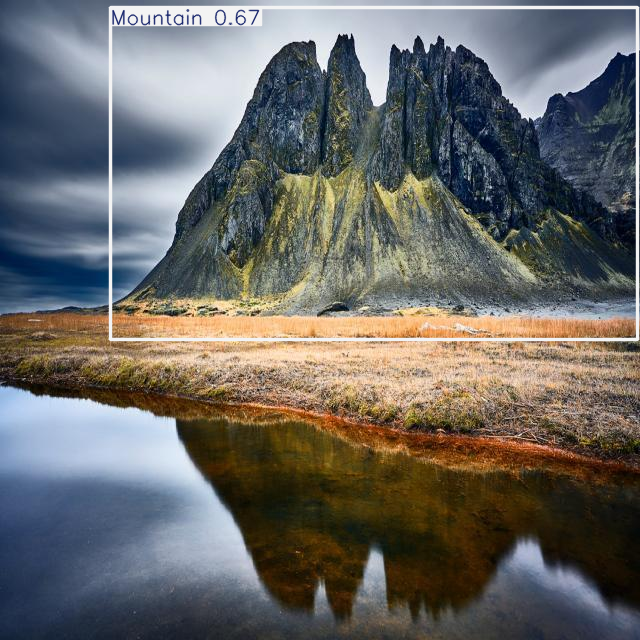

In [24]:
for result in result_1:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(1).jpg")

In [25]:
result_2 = model_1("/kaggle/input/new-data-1/New Data/phone test photos/WhatsApp Image 2024-11-19 at 14.21.42_2eb62ff1.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/phone test photos/WhatsApp Image 2024-11-19 at 14.21.42_2eb62ff1.jpg: 640x480 1 Tree, 43.9ms
Speed: 2.5ms preprocess, 43.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([4.], device='cuda:0')
conf: tensor([0.8033], device='cuda:0')
data: tensor([[2.7121e+02, 1.5255e+02, 9.2492e+02, 1.2833e+03, 8.0330e-01, 4.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1599, 1200)
shape: torch.Size([1, 6])
xywh: tensor([[ 598.0628,  717.9192,  653.7144, 1130.7319]], device='cuda:0')
xywhn: tensor([[0.4984, 0.4490, 0.5448, 0.7071]], device='cuda:0')
xyxy: tensor([[ 271.2056,  152.5533,  924.9200, 1283.2852]], device='cuda:0')
xyxyn: tensor([[0.2260, 0.0954, 0.7708, 0.8026]], device='cuda:0')


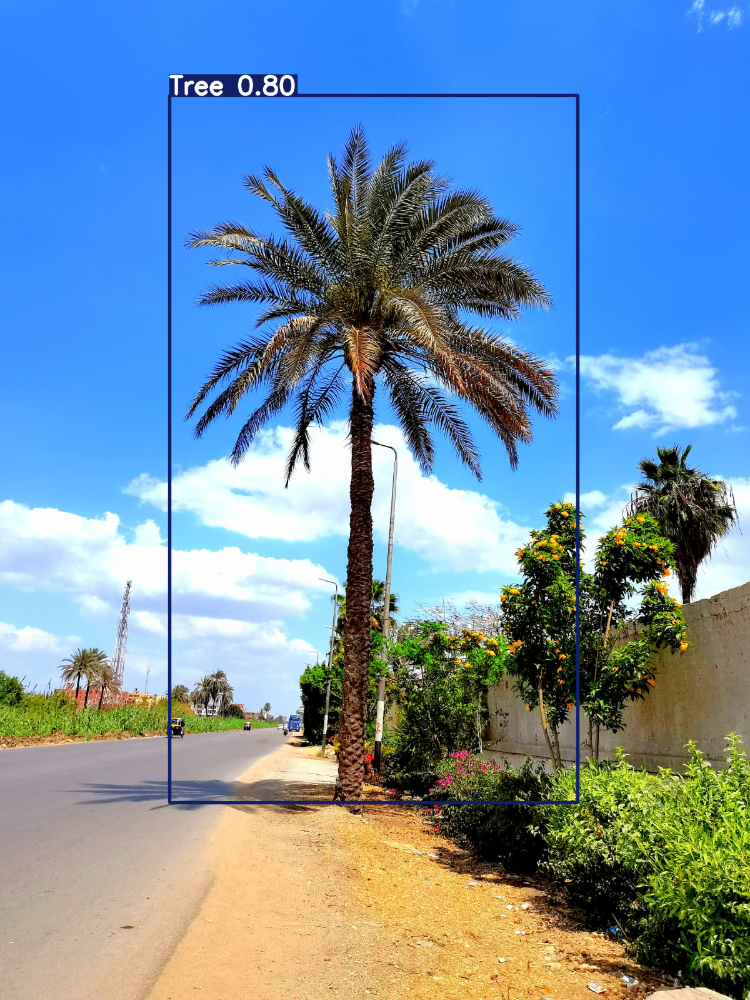

In [26]:
for result in result_2:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(2).jpg")

In [27]:
result_3 = model_1("/kaggle/input/new-data-1/New Data/phone test photos/tree.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/phone test photos/tree.jpg: 640x640 1 Tree, 16.7ms
Speed: 2.8ms preprocess, 16.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([4.], device='cuda:0')
conf: tensor([0.8855], device='cuda:0')
data: tensor([[  3.1623,   0.0000, 640.0000, 634.7085,   0.8855,   4.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[321.5811, 317.3542, 636.8377, 634.7085]], device='cuda:0')
xywhn: tensor([[0.5025, 0.4959, 0.9951, 0.9917]], device='cuda:0')
xyxy: tensor([[  3.1623,   0.0000, 640.0000, 634.7085]], device='cuda:0')
xyxyn: tensor([[0.0049, 0.0000, 1.0000, 0.9917]], device='cuda:0')


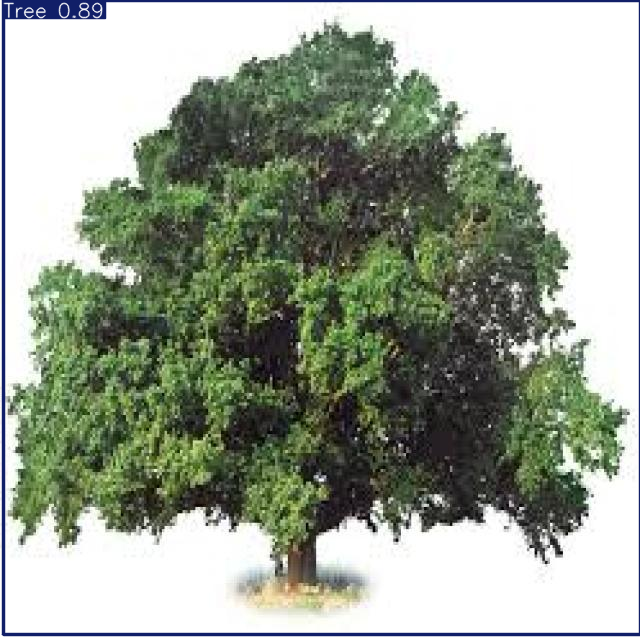

In [28]:
for result in result_3:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(3).jpg")

In [29]:
result_4 = model_1("/kaggle/input/new-data-1/New Data/phone test photos/WhatsApp Image 2024-11-19 at 14.21.57_fbec5b18.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/phone test photos/WhatsApp Image 2024-11-19 at 14.21.57_fbec5b18.jpg: 640x480 1 Tree, 15.5ms
Speed: 2.7ms preprocess, 15.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([4.], device='cuda:0')
conf: tensor([0.9052], device='cuda:0')
data: tensor([[7.9930e+00, 1.5667e+02, 1.1917e+03, 1.5615e+03, 9.0516e-01, 4.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1599, 1200)
shape: torch.Size([1, 6])
xywh: tensor([[ 599.8343,  859.0753, 1183.6825, 1404.8030]], device='cuda:0')
xywhn: tensor([[0.4999, 0.5373, 0.9864, 0.8786]], device='cuda:0')
xyxy: tensor([[   7.9930,  156.6739, 1191.6755, 1561.4768]], device='cuda:0')
xyxyn: tensor([[0.0067, 0.0980, 0.9931, 0.9765]], device='cuda:0')


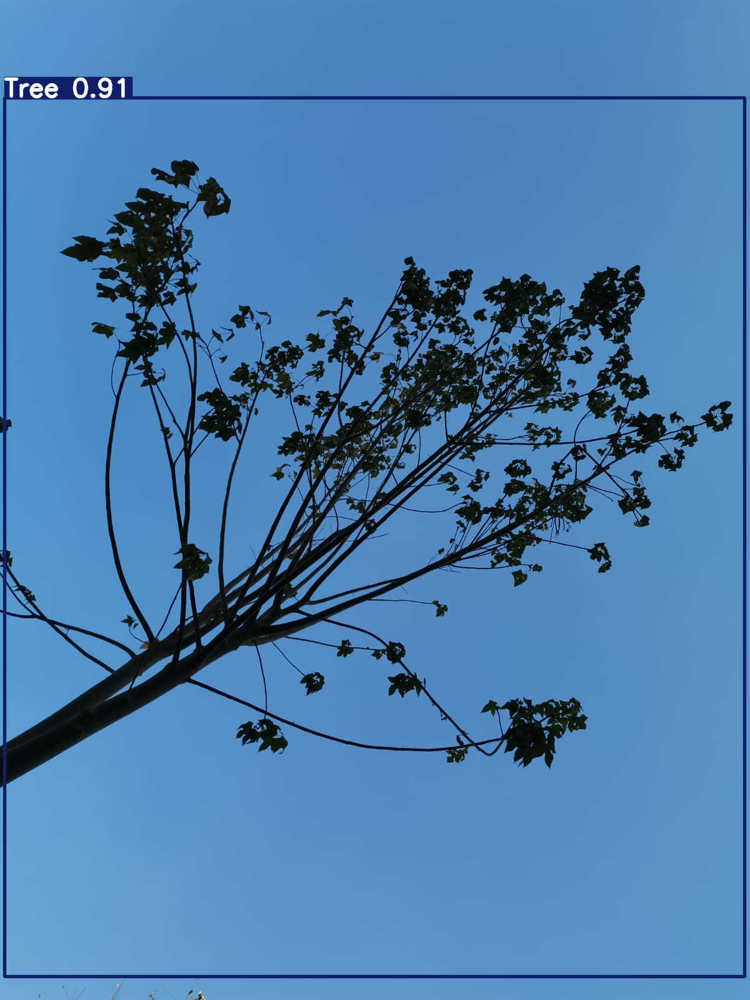

In [30]:
for result in result_4:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(4).jpg")

In [31]:
result_5 = model_1("/kaggle/input/new-data-1/New Data/valid/images/09SCI-TREES-01-bvtj-videoSixteenByNine3000_jpg.rf.95a80f252c93dc67ba836e70361457f7.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/valid/images/09SCI-TREES-01-bvtj-videoSixteenByNine3000_jpg.rf.95a80f252c93dc67ba836e70361457f7.jpg: 640x640 1 Tree, 17.7ms
Speed: 1.9ms preprocess, 17.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([4.], device='cuda:0')
conf: tensor([0.8467], device='cuda:0')
data: tensor([[159.0293,  68.8151, 481.0933, 640.0000,   0.8467,   4.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[320.0613, 354.4075, 322.0640, 571.1849]], device='cuda:0')
xywhn: tensor([[0.5001, 0.5538, 0.5032, 0.8925]], device='cuda:0')
xyxy: tensor([[159.0293,  68.8151, 481.0933, 640.0000]], device='cuda:0')
xyxyn: tensor([[0.2485, 0.1075, 0.7517, 1.0000]], device='cuda:0')


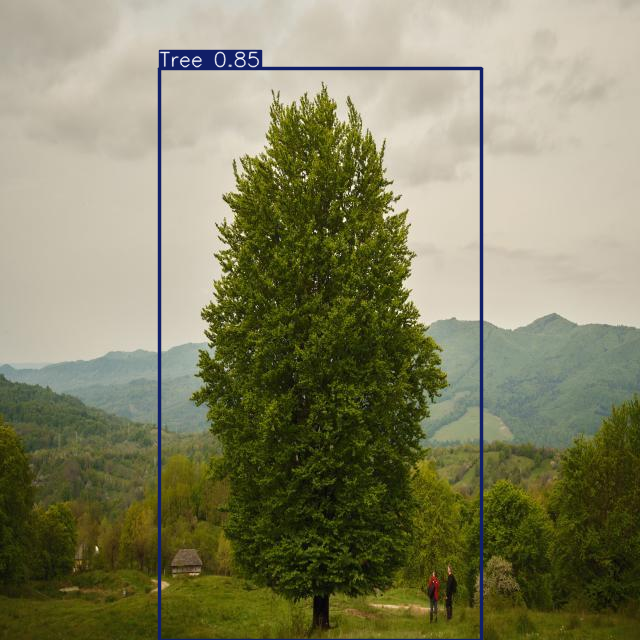

In [32]:
for result in result_5:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(5).jpg")

In [33]:
result_6 = model_1("/kaggle/input/no-tree-pic/wallpaperflare.com_wallpaper (6).jpg")


image 1/1 /kaggle/input/no-tree-pic/wallpaperflare.com_wallpaper (6).jpg: 384x640 (no detections), 47.6ms
Speed: 2.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([], device='cuda:0')
conf: tensor([], device='cuda:0')
data: tensor([], device='cuda:0', size=(0, 6))
id: None
is_track: False
orig_shape: (1080, 1920)
shape: torch.Size([0, 6])
xywh: tensor([], device='cuda:0', size=(0, 4))
xywhn: tensor([], device='cuda:0', size=(0, 4))
xyxy: tensor([], device='cuda:0', size=(0, 4))
xyxyn: tensor([], device='cuda:0', size=(0, 4))


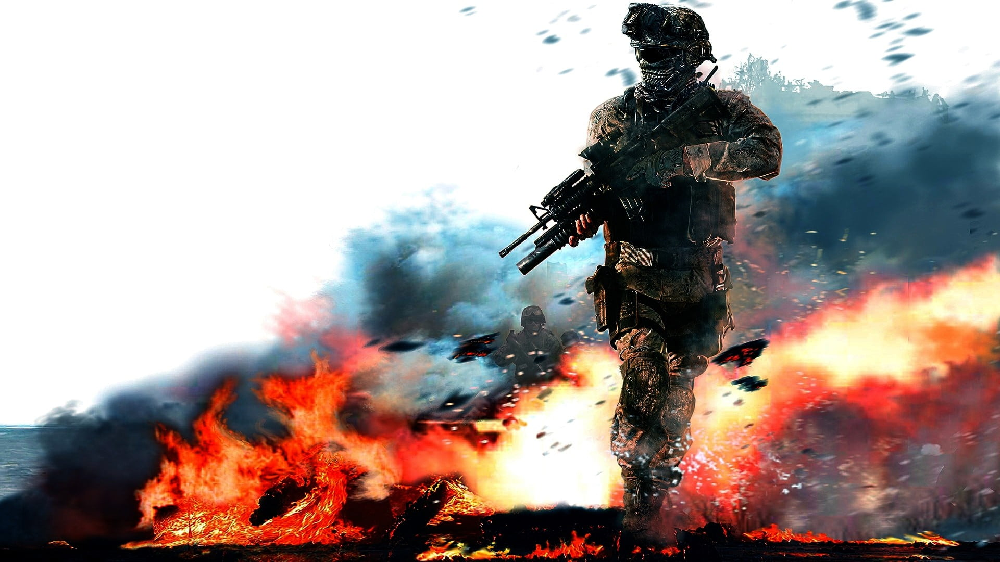

In [34]:
for result in result_6:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(6).jpg")

In [35]:
result_7 = model_1("/kaggle/input/new-data-1/New Data/test/images/-_jpg.rf.048d1b731db5893329af29168158ac9a.jpg")


image 1/1 /kaggle/input/new-data-1/New Data/test/images/-_jpg.rf.048d1b731db5893329af29168158ac9a.jpg: 640x640 1 Tree, 17.2ms
Speed: 1.8ms preprocess, 17.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


ultralytics.engine.results.Boxes object with attributes:

cls: tensor([4.], device='cuda:0')
conf: tensor([0.8156], device='cuda:0')
data: tensor([[242.8912,  78.9067, 615.0167, 604.7178,   0.8156,   4.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[428.9539, 341.8123, 372.1255, 525.8110]], device='cuda:0')
xywhn: tensor([[0.6702, 0.5341, 0.5814, 0.8216]], device='cuda:0')
xyxy: tensor([[242.8912,  78.9067, 615.0167, 604.7178]], device='cuda:0')
xyxyn: tensor([[0.3795, 0.1233, 0.9610, 0.9449]], device='cuda:0')


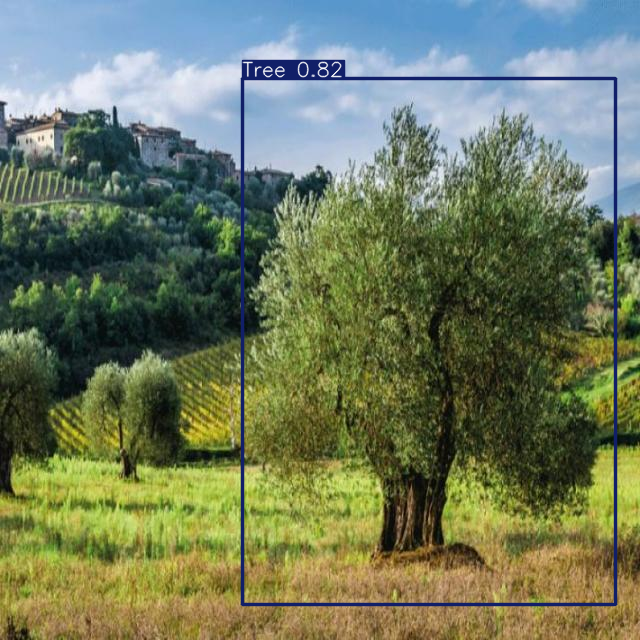

In [36]:
for result in result_7:
    print(result.boxes)
    result.show()
    result.save(filename="afeter train over 5(7).jpg")